In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

In [2]:
#from IPython.core.interactiveshell import InteractiveShell
#InteractiveShell.ast_node_interactivity = 'all'

#pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', 50)

In [3]:
from tqdm import tqdm

In [4]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

In [5]:
from sklearn.preprocessing import LabelEncoder

from sktime.distances import distance
from sktime.transformations.panel.dictionary_based import PAAlegacy as PAA

In [6]:
from sktime.transformations.series.adapt import TabularToSeriesAdaptor
from sklearn.preprocessing import StandardScaler

In [327]:
import matplotlib.colors as clr
cmap = clr.LinearSegmentedColormap.from_list('custom_map', ['#ae0c1b', 'white', '#015697'], N=256)
colors = ['#ae0c1b', '#015697', '#4f845c']

### motif extraction

In [10]:
from matrixprofile import *
from matrixprofile.discords import discords

In [42]:
def motif(ts, w=30,  max_motifs=5, plot = False, **kwargs):


    
    mp, mpi = matrixProfile.stomp(ts.values, w)


    mo, mod  = motifs.motifs(ts.values, (mp, mpi), max_motifs=max_motifs, **kwargs)
    
  #  anoms = discords(mp, ex_zone=8, k=3)

    if plot:
        plt.figure(figsize=(20, 5))

        plt.plot(ts.values)
        colors = ['r', 'g', 'k', 'b', 'y'][:len(mo)]
        for m, d, c in zip(mo, mod, colors):
            for i in m:
                m_shape = ts.values[i:i+w]
                plt.plot(range(i,i+w), m_shape, color=c, lw=3)

        plt.show()
        
        
        
    return mo, mod


In [261]:
def motif_extrac(df, w=30, max_motifs=1,   **kwargs):
    mo_l = []
    mod_l = []
    for i in df.index:
        ts = df.loc[i]
        mo, mod = motif(ts, w=w,  max_motifs=max_motifs,  **kwargs)
        mo_l.append(mo)
        mod_l.append(mod)
    return mo_l, mod_l

In [90]:
def build_ts(df, mo_l, w=30):
    l = []
    for i, mo in enumerate(mo_l):
        ts = df.iloc[i]
        s1, s2 = mo[0][0], mo[0][1]
        a = ts[s1:s1+w]
        a = a.reset_index(drop=True)
       # b = ts[s2:s2+w]
      #  new_ts = pd.concat([a,b]).reset_index(drop=True)
        l.append(a)
    motif_ts = pd.DataFrame(l)
    motif_ts['genre'] = df['genre']
    return motif_ts

In [51]:
approx_paa = pd.read_csv('approx_paa.csv')

In [52]:
approx_paa

,0,1,2,3,4,5,6,7,8,9,...,150,151,152,153,154,155,156,157,158,159
0,-0.990188,0.405509,0.617496,0.614390,0.650476,0.287050,0.663869,0.908472,0.960737,0.517234,...,0.113750,0.224006,0.593993,3.583134,-0.466511,-0.686830,-0.227722,-0.426804,-0.606061,-0.469603
1,1.553743,1.090821,1.066631,0.723694,0.490057,0.716959,0.330081,-0.081903,0.996696,-0.028451,...,1.085626,-0.568447,-0.402992,0.551964,-0.246374,-0.963345,0.119174,-0.406921,-0.380970,0.165669
2,-0.127029,-0.400474,0.348250,0.752103,-0.147291,0.005244,-0.403338,0.047951,0.311437,-0.146674,...,-1.076604,-1.194721,0.298030,-1.025824,-0.948364,-0.918679,1.227328,-0.714182,-0.179138,1.969747
3,-0.973025,-0.741345,-1.174314,-1.744753,-1.392468,-0.620054,-0.706293,-0.151458,-0.051728,0.534938,...,-1.476268,-2.165081,-2.424730,-1.924473,-1.298746,-1.416475,-1.592498,-1.687634,-1.629953,-1.930200
4,-0.093733,0.303603,0.244273,0.165719,-0.586714,0.874889,0.476216,-0.223097,-0.646432,0.083656,...,-0.422288,0.112563,-1.176349,0.206297,-0.621569,0.193699,-0.789707,-0.286435,-0.194497,-0.579005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.752040,-0.048873,0.122449,0.107724,1.660761,0.682098,0.060541,-0.025271,-0.531691,-1.125254,...,-0.264867,-0.646611,1.700152,-0.215985,-0.025199,-0.458915,-0.757078,-0.392786,-0.314165,-0.583916
9996,0.294499,0.646974,0.434328,1.148339,0.226619,1.068907,0.273623,-0.116601,0.046441,-0.503876,...,-0.356596,-0.245442,0.099354,-1.465359,-1.431917,-0.613524,-0.080297,-0.218274,-0.095920,-0.279561
9997,0.201422,1.172308,1.940659,0.771173,0.905954,-0.694559,-0.123780,-0.459544,-0.220141,0.065362,...,0.856303,1.105128,0.719512,-0.136386,0.328654,0.503598,0.883266,0.482583,1.848281,1.087361
9998,-0.985970,-0.346459,-0.424867,-0.563896,-0.878185,-0.025168,-0.640285,-0.432261,-0.399031,-0.959906,...,0.664838,0.491313,0.988805,1.720536,0.638008,-0.221589,0.035015,0.252340,0.522253,-0.965546


In [53]:
approx_paa.iloc[221,:-1]

0      0.115356
1      0.534433
2      1.027452
3     -0.579795
4      1.390778
         ...   
154   -0.846549
155   -0.824344
156   -1.070650
157   -0.612205
158   -1.114872
Name: 221, Length: 159, dtype: float64

In [66]:
mo, mod = motif(approx_paa.iloc[221,:-1], w=10,  max_motifs=2, n_neighbors=2 ,plot = False)

In [16]:
approx_paa.iloc[221]

0              0.115356
1              0.534433
2              1.027452
3             -0.579795
4              1.390778
              ...      
156            -1.07065
157           -0.612205
158           -1.114872
159           -0.835008
genre    minimal-techno
Name: 221, Length: 161, dtype: object

In [93]:
mo_l = []
mod_l = []
tss = approx_paa.iloc[shapelets['index'].values,:-1]
for i in tss.index:
    ts = tss.loc[i]
    mo, mod = motif(ts, w=w,  max_motifs=2, n_neighbors = 2)
    mo_l.append(mo)
    mod_l.append(mo)

In [376]:
w=10
mo_l, mod_l = motif_extrac(approx_paa.iloc[shapelets['index'].values,:-1], w=w, max_motifs=2, n_neighbors=2)

### load shaplets

In [18]:
shapelets = pd.read_csv('shapelets.csv')

In [19]:
shapelets

,gain,length,start_position,dimension,index,genre,shapelet
0,0.068692,11,58,0,221,minimal-techno,[ 0.99780353 -1.32933747 0.27855712 0.466468...
1,0.064445,10,40,0,960,minimal-techno,[ 1.63443577 -1.34464904 0.67924157 0.006374...
2,0.063433,8,100,0,392,minimal-techno,[-0.6358325 -1.06087039 0.78915641 -0.651943...
3,0.062780,8,98,0,116,minimal-techno,[-0.17659318 -1.10786683 -0.14646784 -1.310455...
4,0.055879,10,70,0,331,happy,[-0.51138927 0.20204316 -0.12572058 -0.845883...
...,...,...,...,...,...,...,...
95,0.002490,7,40,0,475,goth,[-0.02077948 -1.3738074 -0.39602712 0.162524...
96,0.002209,7,116,0,376,kids,[-0.13339849 -0.34397314 1.32855599 -0.574656...
97,0.002002,9,108,0,425,kids,[ 1.84738933 0.81492257 -0.39981272 1.209996...
98,0.001919,9,76,0,978,kids,[-0.87167987 -0.35322842 1.10325301 2.286432...


In [39]:
approx_paa.iloc[instance_index].ravel()[start_position:end_position]

array([0.8109387490878733, 1.089616059348487, 0.5374299419112795,
       1.3122175130277622, 0.588944855736844, 0.8783573583871597,
       1.226006219172072, 0.4784434779690941, 1.4526035253915213,
       0.7385395934545795, 0.7840923201152695], dtype=object)

In [76]:
approx_paa.iloc[shapelets['index'].values,:-1]

,0,1,2,3,4,5,6,7,8,9,...,149,150,151,152,153,154,155,156,157,158
221,0.115356,0.534433,1.027452,-0.579795,1.390778,0.415052,-0.062437,1.309140,-0.201668,0.591625,...,-0.844780,-0.886902,-0.959952,-0.600404,-1.121689,-0.846549,-0.824344,-1.070650,-0.612205,-1.114872
960,-0.514826,-0.550367,0.240150,-0.474023,0.830274,-0.962653,0.074893,-0.234703,-0.527199,0.300016,...,-0.923566,-1.703527,-1.056276,-1.803166,-0.495342,-1.044786,-0.806445,0.110147,0.255630,-0.151178
392,-0.839107,0.571788,-0.704071,-0.255281,-0.151134,-0.635318,-1.485681,-0.261010,-1.451190,0.402530,...,0.524062,-0.313536,-0.678223,0.599727,2.324443,0.176625,-0.874857,-0.274244,-0.630014,0.610600
116,1.566267,0.885109,0.961960,2.068779,1.410162,2.258253,0.212158,1.031917,1.754111,1.403777,...,0.681475,-0.999416,-0.568004,0.961589,0.582141,-0.228715,0.060296,-0.563874,-0.265442,-0.448286
331,-0.209713,-0.422985,-0.347392,-0.327498,1.230340,0.599741,0.172762,-0.043726,0.051430,0.010829,...,-0.623444,0.095006,1.054834,0.051590,-0.813986,-0.637888,1.599487,1.019511,-0.265055,-0.979341
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
475,-0.215116,-1.137128,-1.753106,-1.477799,-1.178711,-1.721983,-1.008610,-1.252173,-0.534783,-0.242845,...,0.265818,0.772715,1.538101,1.133378,-1.058082,1.044476,0.499395,0.373111,-0.528680,0.823122
376,-0.368131,0.034360,0.080275,0.437891,-0.495663,-0.318290,-0.541523,-0.473327,-0.125354,0.425337,...,0.256492,1.765544,2.634012,0.322003,-0.359060,-0.264765,-0.111027,0.895812,-0.339408,0.180720
425,0.467794,-0.238099,1.703946,0.579115,-0.446062,-1.080583,-0.790045,0.465582,0.834598,0.147368,...,0.443167,0.139839,0.042581,-0.010266,-0.521712,1.216659,-0.177950,-0.226736,-0.398388,1.658222
978,-0.232244,-0.388760,0.246160,0.124500,-0.022577,-0.364346,-0.172442,-0.020065,-0.691710,-0.101644,...,-0.671334,-0.093205,-0.293287,0.000968,0.425097,-0.434147,-1.151167,-0.921184,-1.037483,-0.299493


In [80]:
ts

,0,1,2,3,4,5,6,7,8,9,...,149,150,151,152,153,154,155,156,157,158
221,0.115356,0.534433,1.027452,-0.579795,1.390778,0.415052,-0.062437,1.309140,-0.201668,0.591625,...,-0.844780,-0.886902,-0.959952,-0.600404,-1.121689,-0.846549,-0.824344,-1.070650,-0.612205,-1.114872
960,-0.514826,-0.550367,0.240150,-0.474023,0.830274,-0.962653,0.074893,-0.234703,-0.527199,0.300016,...,-0.923566,-1.703527,-1.056276,-1.803166,-0.495342,-1.044786,-0.806445,0.110147,0.255630,-0.151178
392,-0.839107,0.571788,-0.704071,-0.255281,-0.151134,-0.635318,-1.485681,-0.261010,-1.451190,0.402530,...,0.524062,-0.313536,-0.678223,0.599727,2.324443,0.176625,-0.874857,-0.274244,-0.630014,0.610600
116,1.566267,0.885109,0.961960,2.068779,1.410162,2.258253,0.212158,1.031917,1.754111,1.403777,...,0.681475,-0.999416,-0.568004,0.961589,0.582141,-0.228715,0.060296,-0.563874,-0.265442,-0.448286
331,-0.209713,-0.422985,-0.347392,-0.327498,1.230340,0.599741,0.172762,-0.043726,0.051430,0.010829,...,-0.623444,0.095006,1.054834,0.051590,-0.813986,-0.637888,1.599487,1.019511,-0.265055,-0.979341
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
475,-0.215116,-1.137128,-1.753106,-1.477799,-1.178711,-1.721983,-1.008610,-1.252173,-0.534783,-0.242845,...,0.265818,0.772715,1.538101,1.133378,-1.058082,1.044476,0.499395,0.373111,-0.528680,0.823122
376,-0.368131,0.034360,0.080275,0.437891,-0.495663,-0.318290,-0.541523,-0.473327,-0.125354,0.425337,...,0.256492,1.765544,2.634012,0.322003,-0.359060,-0.264765,-0.111027,0.895812,-0.339408,0.180720
425,0.467794,-0.238099,1.703946,0.579115,-0.446062,-1.080583,-0.790045,0.465582,0.834598,0.147368,...,0.443167,0.139839,0.042581,-0.010266,-0.521712,1.216659,-0.177950,-0.226736,-0.398388,1.658222
978,-0.232244,-0.388760,0.246160,0.124500,-0.022577,-0.364346,-0.172442,-0.020065,-0.691710,-0.101644,...,-0.671334,-0.093205,-0.293287,0.000968,0.425097,-0.434147,-1.151167,-0.921184,-1.037483,-0.299493


In [92]:
tss.loc[221]

0      0.115356
1      0.534433
2      1.027452
3     -0.579795
4      1.390778
         ...   
154   -0.846549
155   -0.824344
156   -1.070650
157   -0.612205
158   -1.114872
Name: 221, Length: 159, dtype: float64

In [352]:
len(set(idx))

34

[(0.6823529411764706, 0.047058823529411764, 0.10588235294117647, 1.0),
 (0.00392156862745098, 0.33725490196078434, 0.592156862745098, 1.0)]

## overlap motif&shapelets

In [169]:
def check_overlap(interval1, interval2):
    start1, end1 = interval1
    start2, end2 = interval2
    
    # Check for overlap
    if start1 <= end2 and start2 <= end1:
        return True
    else:
        return False

def overlaps(range1, range2):
    start1, end1 = range1
    start2, end2 = range2
    
    # Calculate the start and end of the overlap
    overlap_start = max(start1, start2)
    overlap_end = min(end1, end2)
    
    # Check if there is an actual overlap
    if overlap_start < overlap_end:
        return [overlap_start, overlap_end]
    else:
        return None  # No overlap

In [164]:
start_position, end_position

(58, 69)

In [167]:
mo

[[37, 68], [6, 138]]

In [171]:
end_position

69

In [179]:
ts.values[s:e]

array([-1.29601097,  0.49893229, -1.13166629, -0.13472459, -0.60735484,
       -1.13456957])

In [215]:
m

[18, 151]

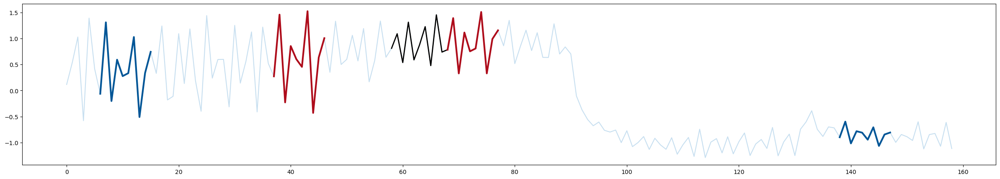

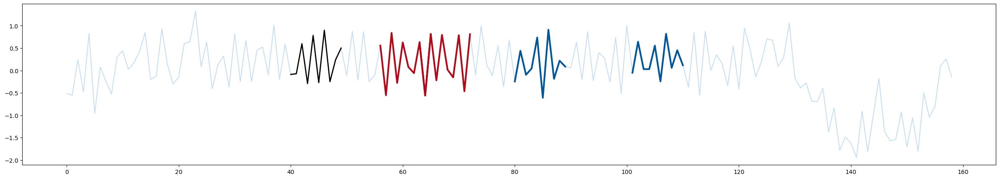

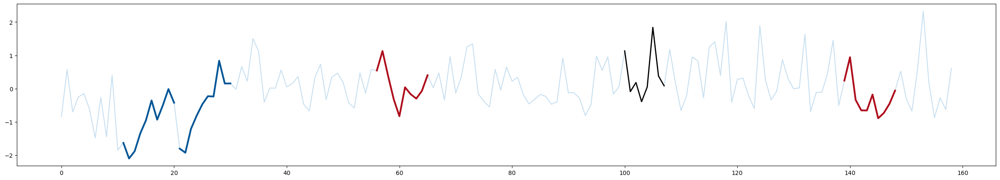

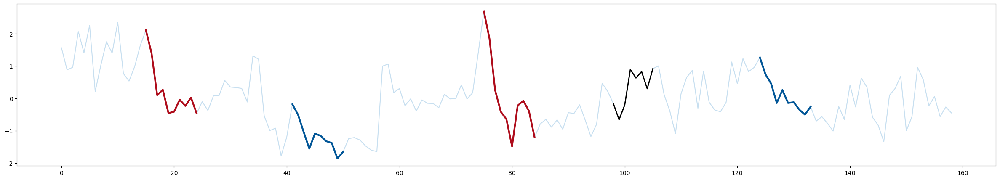

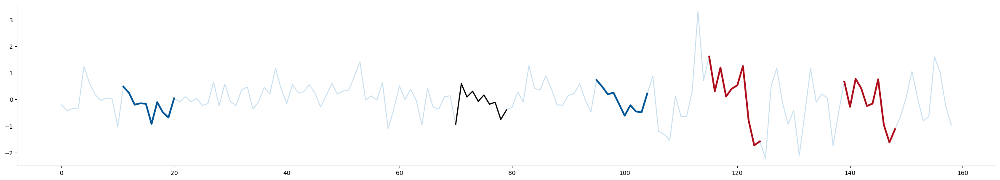

...

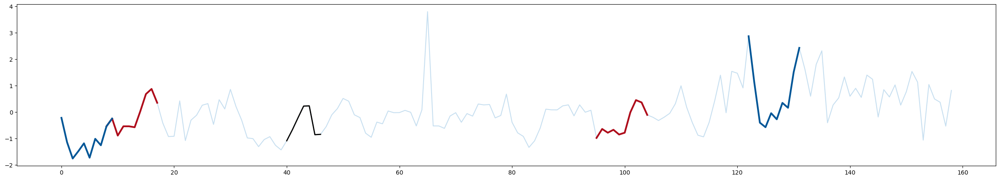

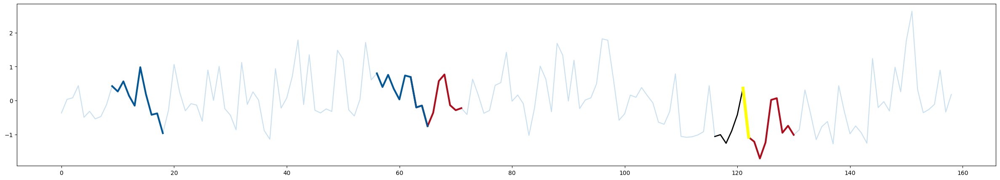

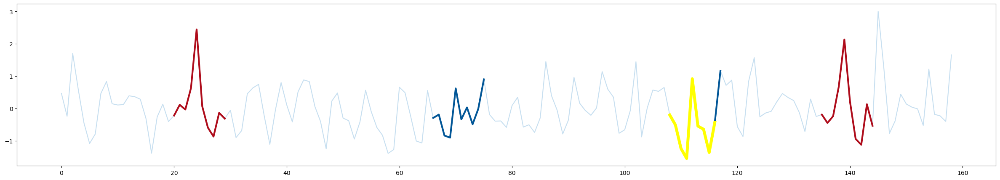

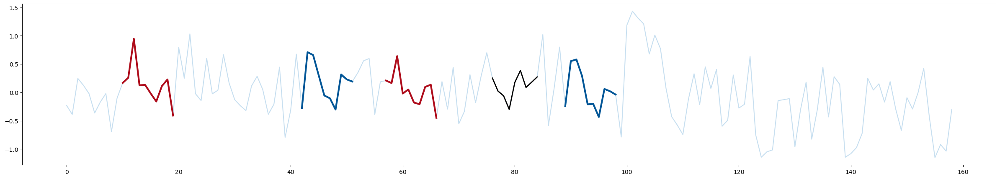

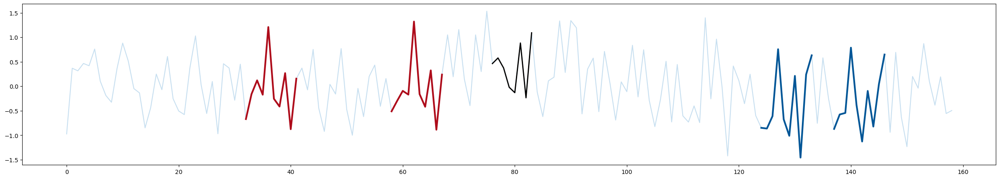

In [378]:
idx = []
for i in range(0, shapelets.shape[0]):
    
    plt.figure(figsize=(30, 5))

    start_position = shapelets.iloc[i, 2]
    instance_index = shapelets.iloc[i, 4]
  #  z_norm_shapelet = shapelets.iloc[i, 6]
    end_position = start_position + shapelets.iloc[i, 1]
    
    ts=approx_paa.iloc[shapelets.iloc[i, 4], :-1]
    plt.plot(ts.values, c='#c7dff0')
    plt.plot(np.arange(start_position, end_position), approx_paa.iloc[instance_index].ravel()[start_position:end_position], linewidth=2, label='shapelet', c='black')
    

    for m, d, c in zip(mo_l[i], mod_l[i], colors):
        for j in m:
            m_shape = ts.values[j:j+w]
            plt.plot(range(j,j+w), m_shape, color=c, lw=3)
            overlaps_rg = overlaps([start_position, end_position-1], [j,j+w-1])
            if overlaps_rg == None:
                    continue
            else:
                s, e = overlaps_rg[0], overlaps_rg[1]+1
                plt.plot(range(s, e), ts.values[s:e],  lw=5, c='yellow')
                idx += [i]
    
   # shapelet = scaler.fit_transform(shapelets.iloc[i, -1].reshape(  1, 1, shapelets.iloc[i, 1]))

    #plt.plot(approx_paa.iloc[shapelets.iloc[i, 4], :-1])
    


    plt.show()


In [332]:
idx = set(idx)
len(idx)/100

0.34

In [307]:
shapelets.iloc[list(idx)].genre.value_counts()

emo                  5
heavy-metal          3
sertanejo            3
synth-pop            3
kids                 3
goth                 2
opera                2
piano                2
honky-tonk           2
progressive-house    2
j-idol               1
happy                1
folk                 1
world-music          1
salsa                1
sleep                1
mpb                  1
Name: genre, dtype: int64

In [309]:
shapelets.iloc[list(idx)].index

Int64Index([ 9, 11, 17, 18, 22, 25, 26, 28, 29, 34, 37, 39, 41, 42, 50, 57, 60,
            62, 65, 69, 70, 71, 75, 76, 77, 78, 81, 83, 84, 86, 90, 92, 96,
            97],
           dtype='int64')

In [312]:
overlaps_shap = shapelets.iloc[list(idx)]

In [319]:
overlaps_shap

,gain,length,start_position,dimension,index,genre,shapelet
9,0.040315,11,49,0,87,happy,[-1.09370916 0.97496101 -0.75576272 1.285871...
11,0.027899,11,134,0,296,progressive-house,[-1.63721535 1.33721388 0.50918985 -0.742573...
17,0.018543,10,35,0,916,progressive-house,[-0.55547543 0.7352658 0.0255804 -0.408240...
18,0.018486,8,121,0,621,opera,[-1.53499205 -1.14156026 -0.7813011 -0.101993...
22,0.015721,7,140,0,642,opera,[-1.35727871 -1.2757036 -0.69365365 0.584346...
25,0.010489,9,146,0,96,sertanejo,[-1.03104624 0.48228269 2.47921115 0.436772...
26,0.009933,11,27,0,945,piano,[-1.81522284 -1.12653948 -0.08836348 -0.369305...
28,0.009353,11,19,0,628,sleep,[-0.93340863 -1.61630234 -1.71516386 -0.744241...
29,0.009142,10,49,0,125,emo,[-0.24474271 -0.35536578 -0.88288919 0.715725...
34,0.008438,7,107,0,554,emo,[-0.52588126 -0.09774104 -0.00956764 2.359814...


In [318]:
approx_paa.iloc[]

,0,1,2,3,4,5,6,7,8,9,...,150,151,152,153,154,155,156,157,158,159
0,-0.990188,0.405509,0.617496,0.614390,0.650476,0.287050,0.663869,0.908472,0.960737,0.517234,...,0.113750,0.224006,0.593993,3.583134,-0.466511,-0.686830,-0.227722,-0.426804,-0.606061,-0.469603
1,1.553743,1.090821,1.066631,0.723694,0.490057,0.716959,0.330081,-0.081903,0.996696,-0.028451,...,1.085626,-0.568447,-0.402992,0.551964,-0.246374,-0.963345,0.119174,-0.406921,-0.380970,0.165669
2,-0.127029,-0.400474,0.348250,0.752103,-0.147291,0.005244,-0.403338,0.047951,0.311437,-0.146674,...,-1.076604,-1.194721,0.298030,-1.025824,-0.948364,-0.918679,1.227328,-0.714182,-0.179138,1.969747
3,-0.973025,-0.741345,-1.174314,-1.744753,-1.392468,-0.620054,-0.706293,-0.151458,-0.051728,0.534938,...,-1.476268,-2.165081,-2.424730,-1.924473,-1.298746,-1.416475,-1.592498,-1.687634,-1.629953,-1.930200
4,-0.093733,0.303603,0.244273,0.165719,-0.586714,0.874889,0.476216,-0.223097,-0.646432,0.083656,...,-0.422288,0.112563,-1.176349,0.206297,-0.621569,0.193699,-0.789707,-0.286435,-0.194497,-0.579005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.752040,-0.048873,0.122449,0.107724,1.660761,0.682098,0.060541,-0.025271,-0.531691,-1.125254,...,-0.264867,-0.646611,1.700152,-0.215985,-0.025199,-0.458915,-0.757078,-0.392786,-0.314165,-0.583916
9996,0.294499,0.646974,0.434328,1.148339,0.226619,1.068907,0.273623,-0.116601,0.046441,-0.503876,...,-0.356596,-0.245442,0.099354,-1.465359,-1.431917,-0.613524,-0.080297,-0.218274,-0.095920,-0.279561
9997,0.201422,1.172308,1.940659,0.771173,0.905954,-0.694559,-0.123780,-0.459544,-0.220141,0.065362,...,0.856303,1.105128,0.719512,-0.136386,0.328654,0.503598,0.883266,0.482583,1.848281,1.087361
9998,-0.985970,-0.346459,-0.424867,-0.563896,-0.878185,-0.025168,-0.640285,-0.432261,-0.399031,-0.959906,...,0.664838,0.491313,0.988805,1.720536,0.638008,-0.221589,0.035015,0.252340,0.522253,-0.965546


In [320]:
approx_paa.iloc[87]

0      0.206361
1     -0.815691
2      0.250647
3     -0.692834
4     -1.076484
         ...   
155    0.198966
156    0.379232
157    0.023950
158    0.124699
159    0.175555
Name: 87, Length: 160, dtype: float64

In [343]:
gen = overlaps_shap.genre.unique()

In [341]:
gens = shapelets.genre.unique()

In [351]:
shapelets

,gain,length,start_position,dimension,index,genre,shapelet
0,0.068692,11,58,0,221,minimal-techno,[ 0.99780353 -1.32933747 0.27855712 0.466468...
1,0.064445,10,40,0,960,minimal-techno,[ 1.63443577 -1.34464904 0.67924157 0.006374...
2,0.063433,8,100,0,392,minimal-techno,[-0.6358325 -1.06087039 0.78915641 -0.651943...
3,0.062780,8,98,0,116,minimal-techno,[-0.17659318 -1.10786683 -0.14646784 -1.310455...
4,0.055879,10,70,0,331,happy,[-0.51138927 0.20204316 -0.12572058 -0.845883...
...,...,...,...,...,...,...,...
95,0.002490,7,40,0,475,goth,[-0.02077948 -1.3738074 -0.39602712 0.162524...
96,0.002209,7,116,0,376,kids,[-0.13339849 -0.34397314 1.32855599 -0.574656...
97,0.002002,9,108,0,425,kids,[ 1.84738933 0.81492257 -0.39981272 1.209996...
98,0.001919,9,76,0,978,kids,[-0.87167987 -0.35322842 1.10325301 2.286432...


In [349]:
shapelets.genre.value_counts()

minimal-techno       5
happy                5
goth                 5
folk                 5
synth-pop            5
kids                 5
honky-tonk           5
world-music          5
songwriter           5
j-idol               5
mpb                  5
salsa                5
emo                  5
piano                5
sertanejo            5
sleep                5
opera                5
progressive-house    5
new-age              5
heavy-metal          5
Name: genre, dtype: int64

In [347]:
set(gens) - set(gen)

{'minimal-techno', 'new-age', 'songwriter'}

In [337]:
shapelets.iloc[i, -2]

'kids'

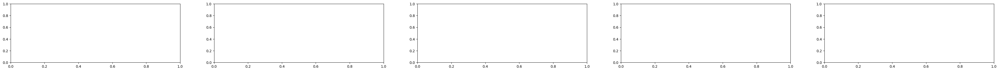

In [357]:
rows=1
cols=5
fig, axes = plt.subplots(rows, cols, figsize=(50, 3))

In [ ]:
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.title('Centroids distribution with different PAA')
plt.legend(by_label.values(), by_label.keys())
plt.show()

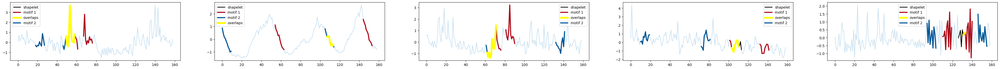

In [384]:
rows=1
cols=5

fig, axes = plt.subplots(rows, cols, figsize=(50, 3))

o=0
for i in range(0, shapelets.shape[0]):

    if i not in idx :
        continue
    if shapelets.iloc[i, -2] != 'emo':
        continue
    
    ax = axes[o]
    o+=1

    start_position = shapelets.iloc[i, 2]
    instance_index = shapelets.iloc[i, 4]
  #  z_norm_shapelet = shapelets.iloc[i, 6]
    end_position = start_position + shapelets.iloc[i, 1]
    
    ts=approx_paa.iloc[shapelets.iloc[i, 4], :-1]
    ax.plot(ts.values, c='#c7dff0')
    ax.plot(np.arange(start_position, end_position), approx_paa.iloc[instance_index].ravel()[start_position:end_position], linewidth=2, label='shapelet', c='black')
    
    q=0
    for m, d, c in zip(mo_l[i], mod_l[i], colors):
       
        for j in m:
            m_shape = ts.values[j:j+w]
            ax.plot(range(j,j+w), m_shape, color=c, lw=3, label=f'motif {q+1}')
            overlaps_rg = overlaps([start_position, end_position-1], [j,j+w-1])
            if overlaps_rg == None:
                    continue
            else:
                s, e = overlaps_rg[0], overlaps_rg[1]+1
                ax.plot(range(s, e), ts.values[s:e],  lw=5, c='yellow', label='overlaps')
                
        q+=1

   # shapelet = scaler.fit_transform(shapelets.iloc[i, -1].reshape(  1, 1, shapelets.iloc[i, 1]))
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
   
    ax.legend(by_label.values(), by_label.keys())
    #plt.plot(approx_paa.iloc[shapelets.iloc[i, 4], :-1])
    


plt.show()
